       Year                    City      PM2.5     Lat    Long Continent  Area
0      1850  Abidjan, Côte d'Ivoire  14.427608    5.36   -4.01    Africa   322
1      1851  Abidjan, Côte d'Ivoire  16.920296    5.36   -4.01    Africa   322
2      1852  Abidjan, Côte d'Ivoire  16.248720    5.36   -4.01    Africa   322
3      1853  Abidjan, Côte d'Ivoire  14.984478    5.36   -4.01    Africa   322
4      1854  Abidjan, Côte d'Ivoire  18.426178    5.36   -4.01    Africa   322
...     ...                     ...        ...     ...     ...       ...   ...
35979  2018       São Paulo, Brazil  16.691668  -23.55  -46.63  SAmerica  8510
35980  2019       São Paulo, Brazil  16.441668  -23.55  -46.63  SAmerica  8510
35981  2020       São Paulo, Brazil  15.591666  -23.55  -46.63  SAmerica  8510
35982  2021       São Paulo, Brazil  16.708334  -23.55  -46.63  SAmerica  8510
35983  2022       São Paulo, Brazil  15.991666  -23.55  -46.63  SAmerica  8510

[35984 rows x 7 columns]


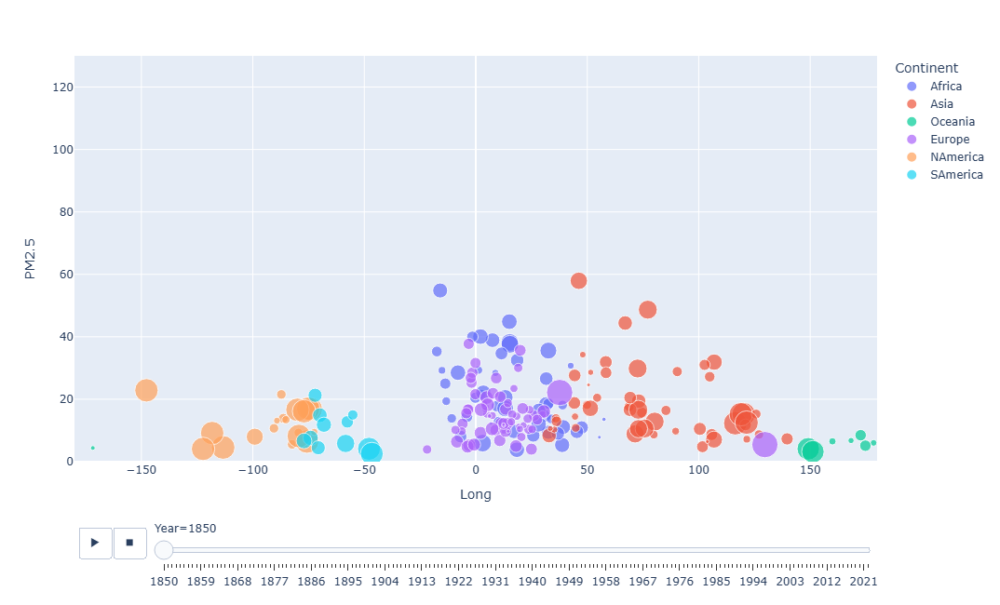

In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go

#y is pm2.5, x is longitude, colour is continent, size is root area, animation is years

#Read in data
air_data = pd.read_csv('airpm2-5.csv', index_col=0, encoding='latin-1')
pos_data = pd.read_csv('CityPos.csv', index_col=0, encoding='latin-1')
to_melt = air_data.iloc[:,0:209]
df_pos = pos_data.iloc[0:5,0:209]

#Format city constants dataframe
df_pos_vertical = df_pos.T
df_pos_vertical = df_pos_vertical.reset_index()
df_pos_vertical.columns = ['City', 'Lat', 'Long', 'Continent', 'Area']

#Format air quality dataframe
to_melt = to_melt.reset_index()
df_long_air = pd.melt(to_melt, id_vars=['Year'], var_name='City', value_name='PM2.5')

#Merge dataframes and rename columns
merged_df = df_long_air.merge(df_pos_vertical, on='City')
merged_df['Lat'] = merged_df['Lat'].astype(float) 
merged_df['Long'] = merged_df['Long'].astype(float) 
merged_df['Area'] = merged_df['Area'].astype(int) 
merged_df['Size'] = merged_df['Area'] ** 0.4


#Plot and animate graph
px.scatter(merged_df, x='Long', y='PM2.5', color='Continent', hover_name='City', size='Size', 
          animation_frame='Year', animation_group='City', range_x=[-180,180], range_y=[0,130],
          width=1000, height=650, hover_data=['Year'])
